###AirQo African Air Quality Project

Project Objective
In this challenge, you are asked to estimate PM2.5 levels from satellite observations
based on Aerosol Optical Depth (AOD) for eight cities in seven African countries -
Lagos, Accra, Nairobi, Yaounde, Bujumbura, Kisumu, Kampala, and Gulu - with
varying ground monitoring resolutions, using appropriate machine learning algorithms.
Ground-based observations in the selected cities will be used to validate the satellite
estimates.

###Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, KFold
from lightgbm import LGBMRegressor
from pathlib import Path

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# To reset this option back to default
#pd.reset_option('display.max_rows')

%matplotlib inline
import warnings
#warnings.filterwarning

##Importing Dataset

In [2]:
aq = pd.read_csv('dataset.csv')
aq.head()

,id,site_id,site_latitude,site_longitude,city,country,date,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
0,id_vjcx08sz91,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-10-25,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052301,828817.9375,-100.805145,21.720518,-123.523796,33.745914,0.122055,2.301404,0.285803,230.693756,0.906039,-100.805145,21.720518,-123.523796,33.745914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.015000
1,id_bkg215syli,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-02,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,0.045475,3771.027210,3399.756845,828569.623806,69.245351,59.159695,-143.370575,26.566997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000214,1.462390,0.000240,0.359150,26.525513,-143.480164,59.220097,70.875954,-0.315206,828578.6250,70.875954,59.220097,-143.480164,26.525513,0.116975,3.049902,0.362203,228.260193,0.364713,70.875954,59.220097,-143.480164,26.525513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.267200
2,id_oui2pot3qd,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-03,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.097816,828878.6875,-96.411942,61.045010,-121.307121,41.898113,0.117559,3.248703,0.384168,224.102463,0.754163,-96.411942,61.045010,-121.307121,41.898113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.7

###DATA INSPECTION

In [3]:
#To check the first 10 rows
aq.head(10)

,id,site_id,site_latitude,site_longitude,city,country,date,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
0,id_vjcx08sz91,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-10-25,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052301,828817.93750,-100.805145,21.720518,-123.523796,33.745914,0.122055,2.301404,0.285803,230.693756,0.906039,-100.805145,21.720518,-123.523796,33.745914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.015000
1,id_bkg215syli,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-02,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,0.045475,3771.027210,3399.756845,828569.623806,69.245351,59.159695,-143.370575,26.566997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000214,1.462390,0.000240,0.359150,26.525513,-143.480164,59.220097,70.875954,-0.315206,828578.62500,70.875954,59.220097,-143.480164,26.525513,0.116975,3.049902,0.362203,228.260193,0.364713,70.875954,59.220097,-143.480164,26.525513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.267200
2,id_oui2pot3qd,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-03,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.097816,828878.68750,-96.411942,61.045010,-121.307121,41.898113,0.117559,3.248703,0.384168,224.102463,0.754163,-96.411942,61.045010,-121.307121,41.898113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [4]:
#To check the last 10 rows
aq.tail(10)

,id,site_id,site_latitude,site_longitude,city,country,date,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
8061,id_sr7iqyf7lj,647f3a5d69df500029a2fc93,-1.268877,36.819139,Nairobi,Kenya,2023-12-31,10,0.000151,0.810763,0.000122,0.085232,74.117470,40.014675,-144.631714,27.205507,0.000053,12.0,0.029100,1757.247336,2704.109829,830068.640560,72.196042,39.890725,-144.588855,27.249831,0.000070,0.000039,0.000031,0.000119,9579.575345,-1.117538,0.058909,830095.4375,74.117470,40.014675,-144.631714,27.205507,0.000041,1.196179,-0.000010,0.085232,27.205507,-144.631714,40.014675,74.117470,-1.117548,830095.437500,74.117470,40.014675,-144.631714,27.205507,0.107413,2.437344,0.267159,227.986633,0.074603,74.117470,40.014675,-144.631714,27.205507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.063002,41324.722656,7443.625488,46660.277344,6443.625488,4.654006,0.214957,74.117470,40.014591,-144.631699,27.205519,9.735000
8062,id_ytkbocrlm7,647f3a5d69df500029a2fc93,-1.268877,36.819139,Nairobi,Kenya,2024-01-13,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.032459,830421.000000,-98.291222,55.262539,-127.362991,35.051670,0.107053,2.947744,0.319609,224.361023,1.000000,-98.291222,55.262539,-127.362991,35.051670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,50819.503906,5848.202148,57268.269531,4848.202148,22.373720,0.217286,-98.291229,55.262642,-127.362976,35.051693,19.280714
8063,id_w2pu97jl18,647f3a5d69df500029a2fc93,-1.268877,36.819139,Nairobi,Kenya,2024-01-14,11,-0.000210,0.888731,-0.000187,0.289614,-

In [5]:
aq.shape

(8071, 80)

In [6]:
aq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8071 entries, 0 to 8070
Data columns (total 80 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   id                                                        8071 non-null   object 
 1   site_id                                                   8071 non-null   object 
 2   site_latitude                                             8071 non-null   float64
 3   site_longitude                                            8071 non-null   float64
 4   city                                                      8071 non-null   object 
 5   country                                                   8071 non-null   object 
 6   date                                                      8071 non-null   object 
 7   hour                                                      8071 non-null   int64  
 8   sulphurdioxide_so2

In [7]:
aq.columns

Index(['id', 'site_id', 'site_latitude', 'site_longitude', 'city', 'country',
       'date', 'hour', 'sulphurdioxide_so2_column_number_density',
       'sulphurdioxide_so2_column_number_density_amf',
       'sulphurdioxide_so2_slant_column_number_density',
       'sulphurdioxide_cloud_fraction', 'sulphurdioxide_sensor_azimuth_angle',
       'sulphurdioxide_sensor_zenith_angle',
       'sulphurdioxide_solar_azimuth_angle',
       'sulphurdioxide_solar_zenith_angle',
       'sulphurdioxide_so2_column_number_density_15km', 'month',
       'carbonmonoxide_co_column_number_density',
       'carbonmonoxide_h2o_column_number_density',
       'carbonmonoxide_cloud_height', 'carbonmonoxide_sensor_altitude',
       'carbonmonoxide_sensor_azimuth_angle',
       'carbonmonoxide_sensor_zenith_angle',
       'carbonmonoxide_solar_azimuth_angle',
       'carbonmonoxide_solar_zenith_angle',
       'nitrogendioxide_no2_column_number_density',
       'nitrogendioxide_tropospheric_no2_column_number_densi

In [8]:
aq.sample()

,id,site_id,site_latitude,site_longitude,city,country,date,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
6494,id_i2p5wdnmmz,6445df535e883c0029282bd3,0.336322,32.631308,Kampala,Uganda,2023-10-20,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,0.028998,2178.654921,1177.924192,829496.221355,-98.063374,28.058137,-110.612409,31.596081,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.020022,829514.5625,-100.516853,28.094236,-110.643616,31.603891,0.113183,2.345553,0.269399,225.624329,0.52864,-100.516853,28.094236,-110.643616,31.603891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.478349,73419.056154,2790.093456,82637.012398,1790.09324,18.263139,0.282839,-100.51786,28.094312,-110.614062,31.60007,9.0776


In [9]:
#To check aggregate
aq.describe().T

,count,mean,std,min,25%,50%,75%,max
site_latitude,8071.0,0.635678,2.154605,-3.459970,0.288630,0.332610,0.374653,6.595400
site_longitude,8071.0,30.246982,9.393151,3.201510,32.568643,32.600480,32.641110,36.914272
hour,8071.0,10.877463,0.815875,10.000000,10.000000,11.000000,11.000000,14.000000
sulphurdioxide_so2_column_number_density,3159.0,0.000024,0.000354,-0.000980,-0.000196,0.000012,0.000221,0.002024
sulphurdioxide_so2_column_number_density_amf,3159.0,0.687295,0.142544,0.299364,0.589849,0.669632,0.766817,1.607052
sulphurdioxide_so2_slant_column_number_density,3159.0,0.000013,0.000220,-0.000696,-0.000137,0.000007,0.000149,0.001101
sulphurdioxide_cloud_fraction,3159.0,0.126581,0.094129,0.000000,0.038062,0.123876,0.209070,0.299850
sulphurdioxide_sensor_azimuth_angle,3159.0,2.120939,85.450554,-107.710861,-98.911720,71.653160,74.110476,77.319656
sulphurdioxide_sensor_zenith_angle,3159.0,38.671939,18.964322,0.177093,22.811537,42.564364,54.238408,66.234924
sulphurdioxide_solar_azimuth_angle,3159.0,-92.912582,43.240479,-165.131509,-134.823883,-95.848477,-49.662067,-22.250822


###Checking for missing values

In [10]:
aq.isnull().sum()

id                                                             0
site_id                                                        0
site_latitude                                                  0
site_longitude                                                 0
city                                                           0
country                                                        0
date                                                           0
hour                                                           0
sulphurdioxide_so2_column_number_density                    4912
sulphurdioxide_so2_column_number_density_amf                4912
sulphurdioxide_so2_slant_column_number_density              4912
sulphurdioxide_cloud_fraction                               4912
sulphurdioxide_sensor_azimuth_angle                         4912
sulphurdioxide_sensor_zenith_angle                          4912
sulphurdioxide_solar_azimuth_angle                          4912
sulphurdioxide_solar_zeni

In [11]:
# Calculate the total number of missing values
total_missing = aq.isna().sum().sum()

# Calculate the total number of values in the DataFrame
total_values = aq.size

# Calculate the percentage of missing values
missing_percentage = (total_missing / total_values) * 100

print(f'Total missing values: {total_missing}')
print(f'Percentage of missing values: {missing_percentage:.2f}%')

Total missing values: 252565
Percentage of missing values: 39.12%


In [12]:
aq.isna().mean()*100

id                                                           0.000000
site_id                                                      0.000000
site_latitude                                                0.000000
site_longitude                                               0.000000
city                                                         0.000000
country                                                      0.000000
date                                                         0.000000
hour                                                         0.000000
sulphurdioxide_so2_column_number_density                    60.859869
sulphurdioxide_so2_column_number_density_amf                60.859869
sulphurdioxide_so2_slant_column_number_density              60.859869
sulphurdioxide_cloud_fraction                               60.859869
sulphurdioxide_sensor_azimuth_angle                         60.859869
sulphurdioxide_sensor_zenith_angle                          60.859869
sulphurdioxide_solar

In [13]:
## Checking the data type of each column

for col in aq.columns:
    print(col)
    print(aq[col].dtype, '\n')

id
object 

site_id
object 

site_latitude
float64 

site_longitude
float64 

city
object 

country
object 

date
object 

hour
int64 

sulphurdioxide_so2_column_number_density
float64 

sulphurdioxide_so2_column_number_density_amf
float64 

sulphurdioxide_so2_slant_column_number_density
float64 

sulphurdioxide_cloud_fraction
float64 

sulphurdioxide_sensor_azimuth_angle
float64 

sulphurdioxide_sensor_zenith_angle
float64 

sulphurdioxide_solar_azimuth_angle
float64 

sulphurdioxide_solar_zenith_angle
float64 

sulphurdioxide_so2_column_number_density_15km
float64 

month
float64 

carbonmonoxide_co_column_number_density
float64 

carbonmonoxide_h2o_column_number_density
float64 

carbonmonoxide_cloud_height
float64 

carbonmonoxide_sensor_altitude
float64 

carbonmonoxide_sensor_azimuth_angle
float64 

carbonmonoxide_sensor_zenith_angle
float64 

carbonmonoxide_solar_azimuth_angle
float64 

carbonmonoxide_solar_zenith_angle
float64 

nitrogendioxide_no2_column_number_density
float64

###Data Cleaning

<Axes: >

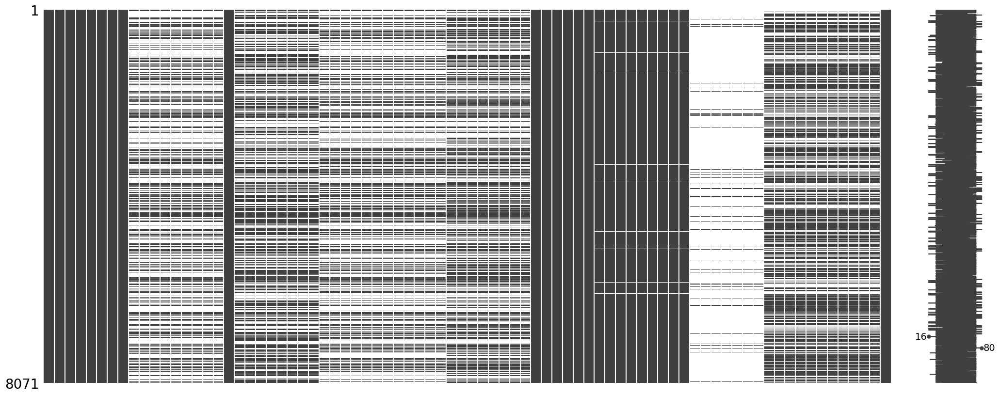

In [14]:
import missingno as msno

#To visualize missing value
msno.matrix(aq)

###Data Cleaning

In [15]:
#To covert to the right data type
# for dates
aq['date'] = pd.to_datetime(aq['date'], errors='coerce')
aq['hour'] = pd.to_datetime(aq['hour'], errors='coerce')
aq['month'] = pd.to_datetime(aq['hour'], errors='coerce')
date= ['date', 'hour', 'month']
#for numerical columns
num = aq.select_dtypes(include=['float64', 'int64']).columns

#for categorical columns
cat = aq.select_dtypes(include=['object', 'category']).columns

In [16]:
aq['year'] = pd.DatetimeIndex(aq.date).year
aq['week'] = pd.DatetimeIndex(aq.date).weekday
aq['day'] = pd.DatetimeIndex(aq.date).day

In [17]:
aq.drop(['date'], axis=1, inplace=True)

In [18]:
for col in aq.columns:
    if col in cat:
        aq[cat]=aq[cat].astype("category")
    elif col in num:
        aq[num]=aq[num].astype("float64")

In [19]:
aq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8071 entries, 0 to 8070
Data columns (total 82 columns):
 #   Column                                                    Non-Null Count  Dtype         
---  ------                                                    --------------  -----         
 0   id                                                        8071 non-null   category      
 1   site_id                                                   8071 non-null   category      
 2   site_latitude                                             8071 non-null   float64       
 3   site_longitude                                            8071 non-null   float64       
 4   city                                                      8071 non-null   category      
 5   country                                                   8071 non-null   category      
 6   hour                                                      8071 non-null   datetime64[ns]
 7   sulphurdioxide_so2_column_number_density  

In [20]:
num_df= aq.select_dtypes('float64').abs()

In [21]:
num_df.head()

,site_latitude,site_longitude,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
0,6.53257,3.39936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052301,828817.9375,100.805145,21.720518,123.523796,33.745914,0.122055,2.301404,0.285803,230.693756,0.906039,100.805145,21.720518,123.523796,33.745914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.015000
1,6.53257,3.39936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.045475,3771.027210,3399.756845,828569.623806,69.245351,59.159695,143.370575,26.566997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000214,1.462390,0.000240,0.359150,26.525513,143.480164,59.220097,70.875954,0.315206,828578.6250,70.875954,59.220097,143.480164,26.525513,0.116975,3.049902,0.362203,228.260193,0.364713,70.875954,59.220097,143.480164,26.525513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.267200
2,6.53257,3.39936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.097816,828878.6875,96.411942,61.045010,121.307121,41.898113,0.117559,3.248703,0.384168,224.102463,0.754163,96.411942,61.045010,121.307121,41.898113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.756392,45185.49959,6791.682888,51171.802486,5791.682829,11.816715,0.192757,96.411890,61.045123,121.307414,41.898269,39.450741
3,6.53257,3.39936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [22]:
#Removing columns that contains over 90% missing values and above
Threshold = 90

missing_values = aq.isna().mean()*100

columns_to_drop = missing_values[missing_values > Threshold].index

aq.drop(columns=columns_to_drop, inplace=True)

In [23]:
#Numerical colums
num = aq.select_dtypes(include=['float64', 'Int64']).columns
                                                  
#Replocing missing values through interpolation
aq[num]= aq[num].interpolate(method='linear', axis=0)

#Selecting non-numerical colums
cat2 = aq.select_dtypes(exclude = ['float64', 'Int64']).columns

In [24]:
# Filing missing volues in non-numerical columns with the mode (most frequent value)
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent')
aq[cat2] = imputer.fit_transform(aq[cat2])

In [25]:
aq.isnull().sum().sort_values(ascending=False)

nitrogendioxide_stratospheric_no2_column_number_density     4
sulphurdioxide_sensor_azimuth_angle                         4
nitrogendioxide_no2_slant_column_number_density             4
nitrogendioxide_tropopause_pressure                         4
nitrogendioxide_absorbing_aerosol_index                     4
nitrogendioxide_cloud_fraction                              4
sulphurdioxide_so2_column_number_density_15km               4
sulphurdioxide_solar_zenith_angle                           4
sulphurdioxide_solar_azimuth_angle                          4
sulphurdioxide_sensor_zenith_angle                          4
sulphurdioxide_cloud_fraction                               4
nitrogendioxide_no2_column_number_density                   4
sulphurdioxide_so2_slant_column_number_density              4
sulphurdioxide_so2_column_number_density_amf                4
sulphurdioxide_so2_column_number_density                    4
nitrogendioxide_sensor_altitude                             4
nitrogen

In [26]:
num_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8071 entries, 0 to 8070
Data columns (total 73 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   site_latitude                                             8071 non-null   float64
 1   site_longitude                                            8071 non-null   float64
 2   sulphurdioxide_so2_column_number_density                  3159 non-null   float64
 3   sulphurdioxide_so2_column_number_density_amf              3159 non-null   float64
 4   sulphurdioxide_so2_slant_column_number_density            3159 non-null   float64
 5   sulphurdioxide_cloud_fraction                             3159 non-null   float64
 6   sulphurdioxide_sensor_azimuth_angle                       3159 non-null   float64
 7   sulphurdioxide_sensor_zenith_angle                        3159 non-null   float64
 8   sulphurdioxide_sol

In [27]:
for col in aq.columns:
    if col in num_df:
        print(aq[col].unique())

[ 6.53257    -1.243396    6.46396    -3.36137     0.3075      0.3517
  0.2182      0.40532     0.306112    6.5954     -3.32664     6.475
  6.5903      6.56148     0.329891   -1.28836     0.29833     0.3564
  0.28863    -3.41682    -1.338275    0.344       0.374653    0.30852
  0.347014    0.381576    6.59441     6.48994     6.440483    6.56134
  6.44205     0.28368    -1.31108     0.333529    0.3323      0.33347
  0.29282     6.4955      6.56909     0.380684    0.39738     6.52724
  0.269993    0.29693    -1.307282    6.54474     6.51440864 -1.287094
 -1.283724    0.32232     0.33261     0.3363219   0.363      -3.35387
  0.39205     0.360209   -3.45997     6.55216    -1.286301    6.48285
 -1.23963    -1.23512     6.51727     6.51767    -1.224292   -3.39263
 -3.38065    -1.2688772 ]
[ 3.39936    36.886487    3.45212    29.36172    32.6206     32.591
 32.6176     32.62027    32.565726    3.29185    29.39641     3.20151
  3.34221     3.25106    32.598999   32.599      36.82314    32.60074

In [28]:
aq=aq.dropna()
aq.head()

,id,site_id,site_latitude,site_longitude,city,country,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5,year,week,day
4,id_ali5x2m4iw,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,1970-01-01 00:00:00.000000013,0.000267,0.774656,0.000207,0.223403,-97.811241,49.513344,-126.064468,40.167336,0.000083,1970-01-01 00:00:00.000000013,0.049045,3514.042054,1678.370478,828902.790450,-96.099639,49.432796,-126.070747,40.144183,0.000097,0.000063,0.000035,0.000175,9582.712645,0.069667,0.142913,828919.00000,-97.811241,49.513344,-126.064468,40.167336,0.000100,1.298433,0.000068,0.223403,40.167336,-126.064468,49.513344,-97.811241,0.069669,828919.00000,-97.811241,49.513344,-126.064468,40.167336,0.117899,2.796072,0.334256,226.368851,0.226150,-97.811241,49.513344,-126.064468,40.167336,0.226141,86197.531250,1451.050659,96215.90625,451.050598,10.521009,0.153114,-97.811241,49.513439,-126.064453,40.167355,19.431731,2023,3,9
5,id_iwv3za16vc,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,1970-01-01 00:00:00.000000013,-0.000130,0.683252,-0.000089,0.144430,-100.809120,21.720835,-130.620255,36.651398,0.000013,1970-01-01 00:00:00.000000013,0.042321,3150.146729,1568.078979,828886.187500,-97.750702,21.729458,-130.629562,36.659386,0.000129,0.000099,0.000035,0.000185,9582.702813,-0.240542,0.163921,828897.18750,-100.826592,21.541787,-130.639148,36.631575,0.000237,1.342056,0.000234,0.330215,36.631575,-130.639148,21.541787,-100.826592,-0.240564,828897.18750,-100.826592,21.541787,-130.639148,36.631575,0.118140,2.333915,0.280587,232.380394,0.331564,-100.826592,21.541787,-130.639148,36.631575,0.195944,81633.613281,1972.522461,91252.10000,972.522412,9.303384,0.165392,-63.545369,47.366656,-129.332227,38.610212,42.032250,2023,4,10
6,id_jsxdghr248,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,1970-01-01 00:00:00.000000013,0.000018,1.093447,0.000015,0.22

In [29]:
aq.isnull().sum().sort_values(ascending=False)

id                                                          0
ozone_sensor_azimuth_angle                                  0
ozone_o3_effective_temperature                              0
ozone_o3_slant_column_number_density                        0
ozone_o3_column_number_density_amf                          0
ozone_o3_column_number_density                              0
uvaerosolindex_solar_zenith_angle                           0
uvaerosolindex_solar_azimuth_angle                          0
uvaerosolindex_sensor_zenith_angle                          0
uvaerosolindex_sensor_azimuth_angle                         0
uvaerosolindex_sensor_altitude                              0
uvaerosolindex_absorbing_aerosol_index                      0
formaldehyde_sensor_azimuth_angle                           0
formaldehyde_sensor_zenith_angle                            0
formaldehyde_solar_azimuth_angle                            0
formaldehyde_solar_zenith_angle                             0
formalde

In [30]:
#to check correlation of the num value
num_df.corr()

,site_latitude,site_longitude,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
site_latitude,1.000000,-0.925838,0.100777,-0.117345,0.035011,0.023506,-0.036967,0.097980,0.439570,0.342123,-0.010503,0.615727,0.205859,-0.168724,-0.549141,-0.027202,0.099175,0.384459,0.222013,0.699659,0.699287,-0.126345,0.745123,-0.187169,0.177837,0.121281,-0.586561,-0.061887,0.117960,0.449525,0.333579,0.187579,0.054630,0.228661,-0.005852,0.300041,0.414192,0.076974,-0.035553,0.062696,-0.458132,-0.025438,0.015100,0.305685,0.189758,-0.021091,0.069236,0.060598,0.175087,-0.100131,-0.029860,0.017635,0.311135,0.183746,-0.149240,0.159241,-0.230795,-0.088993,0.082999,0.265817,0.135758,-0.123796,0.244211,-0.219370,0.244054,-0.219774,-0.056688,-0.474733,-0.052721,0.065718,0.249040,0.159975,0.283363
site_longitude,-0.925838,1.000000,-0.102380,0.149126,-0.030886,-0.013043,0.008333,-0.079726,-0.448750,-0.324148,0.011300,-0.730661,-0.349625,0.099054,0.639064,0.013598,-0.064791,-0.393051,-0.176597,-0.689720,-0.687495,0.092666,-0.715982,0.212884,-0.167862,-0.078920,0.659171,0.038071,-0.098122,-0.453888,-0.310961,-0.224019,0.022775,-0.243773,0.022866,-0.267242,-0.421995,-0.058246,0.018000,-0.065580,0.576669,0.020693,-0.012309,-0.333010,-0.127992,-0.026300,-0.043221,-0.046183,-0.108026,0.105004,0.023164,-0.013752,-0.337048,-0.125138,0.175495,-0.190113,0.187213,0.090679,-0.025046,-0.263802,-0.050328,0.113115,-0.076946,0.060338,-0.075676,0.060236,0.023976,0.365192,0.028894,-0.105542,-0.279245,-0.073977,-0.305682
sulphurdioxide_so2_column_number_density,0.100777,-0.102380,1.000000,-0.279195,0.942828,-0.019477,-

###Exploratory Data Analysis

1. Univariate EDA on Numerical Variables

In [31]:
aq.describe().T

,count,mean,min,25%,50%,75%,max,std
site_latitude,8067.0,0.632754,-3.45997,0.28863,0.33261,0.374653,6.5954,2.151132
site_longitude,8067.0,30.260294,3.20151,32.568643,32.60048,32.64111,36.914272,9.376428
hour,8067,1970-01-01 00:00:00.000000010,1970-01-01 00:00:00.000000010,1970-01-01 00:00:00.000000010,1970-01-01 00:00:00.000000011,1970-01-01 00:00:00.000000011,1970-01-01 00:00:00.000000014,NaN
sulphurdioxide_so2_column_number_density,8067.0,0.000012,-0.00098,-0.000177,0.000002,0.000175,0.002024,0.000306
sulphurdioxide_so2_column_number_density_amf,8067.0,0.701246,0.299364,0.61545,0.69367,0.771836,1.607052,0.127833
sulphurdioxide_so2_slant_column_number_density,8067.0,0.000005,-0.000696,-0.000123,0.0,0.000122,0.001101,0.000195
sulphurdioxide_cloud_fraction,8067.0,0.133458,0.0,0.068714,0.134841,0.19888,0.29985,0.08201
sulphurdioxide_sensor_azimuth_angle,8067.0,1.977703,-107.710861,-76.821637,15.78295,73.008435,77.319656,71.556513
sulphurdioxide_sensor_zenith_angle,8067.0,39.037141,0.177093,27.672076,41.409249,51.515479,66.234924,16.232791
sulphurdioxide_solar_azimuth_angle,8067.0,-89.321801,-165.131509,-130.321603,-84.936112,-48.678225,-22.250822,41.61208


In [32]:
aq[num].hist(figsize=(50,200))
plt.show()

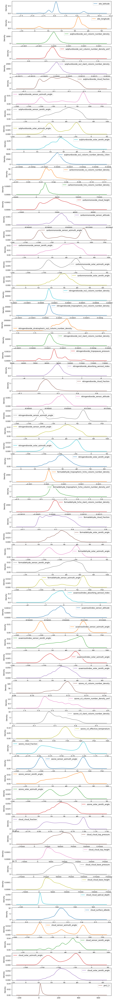

In [33]:
aq[num].plot(kind='density', subplots=True, sharex=False, figsize=(10, 100))
plt.show()

site_latitude                                                  Axes(0.125,0.865019;0.352273x0.0149805)
site_longitude                                              Axes(0.547727,0.865019;0.352273x0.0149805)
sulphurdioxide_so2_column_number_density                       Axes(0.125,0.847043;0.352273x0.0149805)
sulphurdioxide_so2_column_number_density_amf                Axes(0.547727,0.847043;0.352273x0.0149805)
sulphurdioxide_so2_slant_column_number_density                 Axes(0.125,0.829066;0.352273x0.0149805)
sulphurdioxide_cloud_fraction                               Axes(0.547727,0.829066;0.352273x0.0149805)
sulphurdioxide_sensor_azimuth_angle                            Axes(0.125,0.811089;0.352273x0.0149805)
sulphurdioxide_sensor_zenith_angle                          Axes(0.547727,0.811089;0.352273x0.0149805)
sulphurdioxide_solar_azimuth_angle                             Axes(0.125,0.793113;0.352273x0.0149805)
sulphurdioxide_solar_zenith_angle                           Axes(0.547727

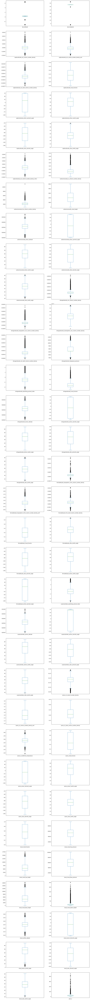

In [34]:
aq[num].plot(kind='box', 
                   subplots=True, 
                   layout=(43, 2), 
                   sharex=False, 
                   figsize=(16, 250))

##2. EDA on categorical variable

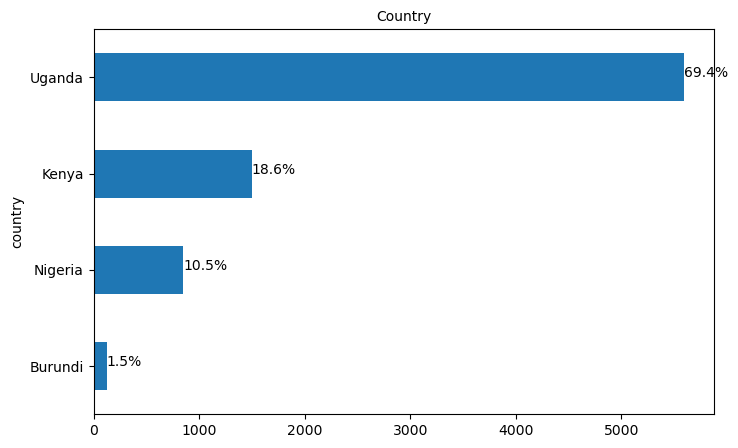

In [35]:
ax = aq['country'].value_counts().sort_values().plot(kind = 'barh', figsize=(8,5))
plt.title("Country", fontdict={'size': 10})
for p in ax.patches:
    percentage ='{:,.1f}%'.format((p.get_width()/aq.shape[0])*100)
    width, height =p.get_width(),p.get_height()
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))

##Dealing with categorical variables

In [36]:
aq.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8067 entries, 4 to 8070
Data columns (total 75 columns):
 #   Column                                                    Non-Null Count  Dtype         
---  ------                                                    --------------  -----         
 0   id                                                        8067 non-null   object        
 1   site_id                                                   8067 non-null   object        
 2   site_latitude                                             8067 non-null   float64       
 3   site_longitude                                            8067 non-null   float64       
 4   city                                                      8067 non-null   object        
 5   country                                                   8067 non-null   object        
 6   hour                                                      8067 non-null   datetime64[ns]
 7   sulphurdioxide_so2_column_number_density       

In [37]:
cat_df = aq.select_dtypes(include=['object', 'category'])
cat_df.columns

Index(['id', 'site_id', 'city', 'country', 'year', 'week', 'day'], dtype='object')

In [38]:
# Encoding the categorical features
aq = pd.get_dummies(data = aq, columns = ['id', 'site_id', 'city', 'country'], drop_first = True)
aq.head()

,site_latitude,site_longitude,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5,year,week,day,id_id_00l1c858y7,id_id_00n0wqjqa2,id_id_00wgidkvyv,id_id_010i39up9e,id_id_0168zpa1ht,id_id_018adrt1ka,id_id_01espuo1dn,id_id_01y6kp1otv,id_id_01z88atf3v,id_id_022gnym1s5,id_id_028gtolcsn,id_id_029a4ugzi2,id_id_02af5t8d36,id_id_02bc2q5x94,id_id_02fhdu2yxx,id_id_02hsadcwl9,id_id_02mf0t6b64,id_id_03413htg87,id_id_034bn7gwep,id_id_038r6lx4s2,id_id_03cahxu2ax,id_id_03fpna69gs,id_id_043tep6s22,id_id_045ps6giu0,id_id_048pon0ei7,id_id_04gqzuc4ta,id_id_04l1bf1lcf,id_id_04laxn8qvn,id_id_04nj53hzp1,id_id_05ih0wikp1,id_id_05lwtpt14t,id_id_05r6nikgfp,id_id_0610lafegz,id_id_067fhgrf8l,id_id_06a02dv3wl,id_id_06ig6jrkb4,id_id_06l5haxl97,id_id_06lkxd9yy2,id_id_06ny4qatz8,id_id_06o6l1o4jk,id_id_06qa2oaes6,id_id_0754p65t70,id_id_079dt541g7,id_id_07d8r9n9x0,id_id_07j373v40n,id_id_07xb036p2n,id_id_0856r1kp38,id_id_08eodkfjqa,id_id_08hwlatdbp,id_id_08lge8y8sl,id_id_08rms3stm4,id_id_08syjrrrm3,id_id_08t66kejsv,id_id_09798egckd,id_id_09drfdovda,id_id_09jn14m6g0,id_id_0a2tq2l2oh,id_id_0a5eygzk33,id_id_0abttpxz4h,id_id_0aetulf0cg,id_id_0agzl1fyvx,id_id_0allm8hf93,id_id_0ambqk80vr,id_id_0av77flirr,id_id_0axah8pvdp,id_id_0b366wck2q,id_id_0b4r0iko7j,id_id_0b7oo8zxca,id_id_0bdtxpnbkx,id_id_0bhigzotds,id_id_0bjd4rpite,id_id_0bs5nx59mr,id_id_0bxg8c3vku,id_id_0c3kgvm1z0,id_id_0c42zvm2wj,id_id_0c6c13es7g,id_id_0cf0hxjoac,id_id_0cfkynhu3x,id_id_0cg2cic9px,id_id_0crtqwtpvd,id_id_0cvkjg10ri,id_id_0d3kvwttnn,id_id_0d63z0bb4s,id_id_0e0718phr4,id_id_0e7x81tvxd,id_id_0ecbrbfz48,id_id_0eeesaffx4,id_id_0egntyx3d9,id_id_0esfrwiitc,id_id_0euzdm4gii,id_id_0ew5x70xht,id_id_0f9zpk2c24,id_id_0fa6pswtwl,id_id_0fkxnabmbu,id_id_0fnt42c892,id_id_0fqhiuwuk8,id_id_0fwdp2a8ww,id_id_0fxa2fgbv1,id_id_0fzdq6x0y5,id_id_0g0n0yq9cp,id_id_0gc1k9448p,id_id_0gg927nztk,id_id_0gvlgyvx6z,id_id_0h84v7wv2x,id_

##Feature selection and Transformation

In [39]:
X = aq.drop(columns=['pm2_5','hour','month','year', 'week', 'day'])
y = aq["pm2_5"]

In [40]:
X.head()

,site_latitude,site_longitude,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,id_id_00l1c858y7,id_id_00n0wqjqa2,id_id_00wgidkvyv,id_id_010i39up9e,id_id_0168zpa1ht,id_id_018adrt1ka,id_id_01espuo1dn,id_id_01y6kp1otv,id_id_01z88atf3v,id_id_022gnym1s5,id_id_028gtolcsn,id_id_029a4ugzi2,id_id_02af5t8d36,id_id_02bc2q5x94,id_id_02fhdu2yxx,id_id_02hsadcwl9,id_id_02mf0t6b64,id_id_03413htg87,id_id_034bn7gwep,id_id_038r6lx4s2,id_id_03cahxu2ax,id_id_03fpna69gs,id_id_043tep6s22,id_id_045ps6giu0,id_id_048pon0ei7,id_id_04gqzuc4ta,id_id_04l1bf1lcf,id_id_04laxn8qvn,id_id_04nj53hzp1,id_id_05ih0wikp1,id_id_05lwtpt14t,id_id_05r6nikgfp,id_id_0610lafegz,id_id_067fhgrf8l,id_id_06a02dv3wl,id_id_06ig6jrkb4,id_id_06l5haxl97,id_id_06lkxd9yy2,id_id_06ny4qatz8,id_id_06o6l1o4jk,id_id_06qa2oaes6,id_id_0754p65t70,id_id_079dt541g7,id_id_07d8r9n9x0,id_id_07j373v40n,id_id_07xb036p2n,id_id_0856r1kp38,id_id_08eodkfjqa,id_id_08hwlatdbp,id_id_08lge8y8sl,id_id_08rms3stm4,id_id_08syjrrrm3,id_id_08t66kejsv,id_id_09798egckd,id_id_09drfdovda,id_id_09jn14m6g0,id_id_0a2tq2l2oh,id_id_0a5eygzk33,id_id_0abttpxz4h,id_id_0aetulf0cg,id_id_0agzl1fyvx,id_id_0allm8hf93,id_id_0ambqk80vr,id_id_0av77flirr,id_id_0axah8pvdp,id_id_0b366wck2q,id_id_0b4r0iko7j,id_id_0b7oo8zxca,id_id_0bdtxpnbkx,id_id_0bhigzotds,id_id_0bjd4rpite,id_id_0bs5nx59mr,id_id_0bxg8c3vku,id_id_0c3kgvm1z0,id_id_0c42zvm2wj,id_id_0c6c13es7g,id_id_0cf0hxjoac,id_id_0cfkynhu3x,id_id_0cg2cic9px,id_id_0crtqwtpvd,id_id_0cvkjg10ri,id_id_0d3kvwttnn,id_id_0d63z0bb4s,id_id_0e0718phr4,id_id_0e7x81tvxd,id_id_0ecbrbfz48,id_id_0eeesaffx4,id_id_0egntyx3d9,id_id_0esfrwiitc,id_id_0euzdm4gii,id_id_0ew5x70xht,id_id_0f9zpk2c24,id_id_0fa6pswtwl,id_id_0fkxnabmbu,id_id_0fnt42c892,id_id_0fqhiuwuk8,id_id_0fwdp2a8ww,id_id_0fxa2fgbv1,id_id_0fzdq6x0y5,id_id_0g0n0yq9cp,id_id_0gc1k9448p,id_id_0gg927nztk,id_id_0gvlgyvx6z,id_id_0h84v7wv2x,id_id_0hmullnthx,id_id_0hro1xjt35,

In [41]:
X.shape

(8067, 8205)

In [42]:
y.shape

(8067,)

In [43]:
### Loading in Library for StandardScaler

from sklearn.preprocessing import StandardScaler

In [44]:
## scaling the dataset using StandardScaler

scaler = StandardScaler()
scalaer = scaler.fit(X)
standardized_x = scaler.transform(X)
#standardized_x[0:5]

In [45]:
standardized_x.shape

(8067, 8205)

In [46]:
## Converting the scaled data (Feature) to DataFrame 

standardized_x_df = pd.DataFrame(standardized_x, columns=X.columns)

standardized_x_df.head(5)

,site_latitude,site_longitude,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,id_id_00l1c858y7,id_id_00n0wqjqa2,id_id_00wgidkvyv,id_id_010i39up9e,id_id_0168zpa1ht,id_id_018adrt1ka,id_id_01espuo1dn,id_id_01y6kp1otv,id_id_01z88atf3v,id_id_022gnym1s5,id_id_028gtolcsn,id_id_029a4ugzi2,id_id_02af5t8d36,id_id_02bc2q5x94,id_id_02fhdu2yxx,id_id_02hsadcwl9,id_id_02mf0t6b64,id_id_03413htg87,id_id_034bn7gwep,id_id_038r6lx4s2,id_id_03cahxu2ax,id_id_03fpna69gs,id_id_043tep6s22,id_id_045ps6giu0,id_id_048pon0ei7,id_id_04gqzuc4ta,id_id_04l1bf1lcf,id_id_04laxn8qvn,id_id_04nj53hzp1,id_id_05ih0wikp1,id_id_05lwtpt14t,id_id_05r6nikgfp,id_id_0610lafegz,id_id_067fhgrf8l,id_id_06a02dv3wl,id_id_06ig6jrkb4,id_id_06l5haxl97,id_id_06lkxd9yy2,id_id_06ny4qatz8,id_id_06o6l1o4jk,id_id_06qa2oaes6,id_id_0754p65t70,id_id_079dt541g7,id_id_07d8r9n9x0,id_id_07j373v40n,id_id_07xb036p2n,id_id_0856r1kp38,id_id_08eodkfjqa,id_id_08hwlatdbp,id_id_08lge8y8sl,id_id_08rms3stm4,id_id_08syjrrrm3,id_id_08t66kejsv,id_id_09798egckd,id_id_09drfdovda,id_id_09jn14m6g0,id_id_0a2tq2l2oh,id_id_0a5eygzk33,id_id_0abttpxz4h,id_id_0aetulf0cg,id_id_0agzl1fyvx,id_id_0allm8hf93,id_id_0ambqk80vr,id_id_0av77flirr,id_id_0axah8pvdp,id_id_0b366wck2q,id_id_0b4r0iko7j,id_id_0b7oo8zxca,id_id_0bdtxpnbkx,id_id_0bhigzotds,id_id_0bjd4rpite,id_id_0bs5nx59mr,id_id_0bxg8c3vku,id_id_0c3kgvm1z0,id_id_0c42zvm2wj,id_id_0c6c13es7g,id_id_0cf0hxjoac,id_id_0cfkynhu3x,id_id_0cg2cic9px,id_id_0crtqwtpvd,id_id_0cvkjg10ri,id_id_0d3kvwttnn,id_id_0d63z0bb4s,id_id_0e0718phr4,id_id_0e7x81tvxd,id_id_0ecbrbfz48,id_id_0eeesaffx4,id_id_0egntyx3d9,id_id_0esfrwiitc,id_id_0euzdm4gii,id_id_0ew5x70xht,id_id_0f9zpk2c24,id_id_0fa6pswtwl,id_id_0fkxnabmbu,id_id_0fnt42c892,id_id_0fqhiuwuk8,id_id_0fwdp2a8ww,id_id_0fxa2fgbv1,id_id_0fzdq6x0y5,id_id_0g0n0yq9cp,id_id_0gc1k9448p,id_id_0gg927nztk,id_id_0gvlgyvx6z,id_id_0h84v7wv2x,id_id_0hmullnthx,id_id_0hro1xjt35,

In [47]:
## Converting the Target Variable to DataFrame 

Y_df = pd.DataFrame(y)
Y_df.head()

,pm2_5
4,19.431731
5,42.032250
6,26.417667
7,272.091429
8,123.559000


In [48]:
## Concating the Target (Y) and the Feature (X) variables
## Recall that the data set was splitted to all for scaling, hence the need to concat them. 

aq2 = pd.concat([standardized_x_df, Y_df], axis = 1)
aq2.head()

,site_latitude,site_longitude,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,id_id_00l1c858y7,id_id_00n0wqjqa2,id_id_00wgidkvyv,id_id_010i39up9e,id_id_0168zpa1ht,id_id_018adrt1ka,id_id_01espuo1dn,id_id_01y6kp1otv,id_id_01z88atf3v,id_id_022gnym1s5,id_id_028gtolcsn,id_id_029a4ugzi2,id_id_02af5t8d36,id_id_02bc2q5x94,id_id_02fhdu2yxx,id_id_02hsadcwl9,id_id_02mf0t6b64,id_id_03413htg87,id_id_034bn7gwep,id_id_038r6lx4s2,id_id_03cahxu2ax,id_id_03fpna69gs,id_id_043tep6s22,id_id_045ps6giu0,id_id_048pon0ei7,id_id_04gqzuc4ta,id_id_04l1bf1lcf,id_id_04laxn8qvn,id_id_04nj53hzp1,id_id_05ih0wikp1,id_id_05lwtpt14t,id_id_05r6nikgfp,id_id_0610lafegz,id_id_067fhgrf8l,id_id_06a02dv3wl,id_id_06ig6jrkb4,id_id_06l5haxl97,id_id_06lkxd9yy2,id_id_06ny4qatz8,id_id_06o6l1o4jk,id_id_06qa2oaes6,id_id_0754p65t70,id_id_079dt541g7,id_id_07d8r9n9x0,id_id_07j373v40n,id_id_07xb036p2n,id_id_0856r1kp38,id_id_08eodkfjqa,id_id_08hwlatdbp,id_id_08lge8y8sl,id_id_08rms3stm4,id_id_08syjrrrm3,id_id_08t66kejsv,id_id_09798egckd,id_id_09drfdovda,id_id_09jn14m6g0,id_id_0a2tq2l2oh,id_id_0a5eygzk33,id_id_0abttpxz4h,id_id_0aetulf0cg,id_id_0agzl1fyvx,id_id_0allm8hf93,id_id_0ambqk80vr,id_id_0av77flirr,id_id_0axah8pvdp,id_id_0b366wck2q,id_id_0b4r0iko7j,id_id_0b7oo8zxca,id_id_0bdtxpnbkx,id_id_0bhigzotds,id_id_0bjd4rpite,id_id_0bs5nx59mr,id_id_0bxg8c3vku,id_id_0c3kgvm1z0,id_id_0c42zvm2wj,id_id_0c6c13es7g,id_id_0cf0hxjoac,id_id_0cfkynhu3x,id_id_0cg2cic9px,id_id_0crtqwtpvd,id_id_0cvkjg10ri,id_id_0d3kvwttnn,id_id_0d63z0bb4s,id_id_0e0718phr4,id_id_0e7x81tvxd,id_id_0ecbrbfz48,id_id_0eeesaffx4,id_id_0egntyx3d9,id_id_0esfrwiitc,id_id_0euzdm4gii,id_id_0ew5x70xht,id_id_0f9zpk2c24,id_id_0fa6pswtwl,id_id_0fkxnabmbu,id_id_0fnt42c892,id_id_0fqhiuwuk8,id_id_0fwdp2a8ww,id_id_0fxa2fgbv1,id_id_0fzdq6x0y5,id_id_0g0n0yq9cp,id_id_0gc1k9448p,id_id_0gg927nztk,id_id_0gvlgyvx6z,id_id_0h84v7wv2x,id_id_0hmullnthx,id_id_0hro1xjt35,

###Machine learning

In [49]:
#Splitting with a ratio of 70% (train), 30% (test)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.30, random_state=42)

##Random forest regressor

In [50]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import math

In [51]:
### Instantiating the RandomForest Regressor
rf = RandomForestRegressor() 

### Fitting the training set to the model
rf.fit( X_train, y_train)
print("Training_score : " , rf.score(X_train, y_train)) 

Training_score :  0.9518747658650015


In [52]:
### Predicitng the Test data
y_pred = rf.predict(X_test)

In [53]:
print('Testing score:', r2_score(y_test, y_pred))
print('\n Mean square error', mean_squared_error(y_test, y_pred))
print('\n Mean absolute error',mean_absolute_error(y_test,y_pred))
print('\n Root mean squared error',np.sqrt(mean_squared_error(y_test,y_pred)))

Testing score: 0.5548747278318757

 Mean square error 200.44668585700444

 Mean absolute error 6.2114753461333985

 Root mean squared error 14.157919545505422


In [54]:
#To compare y_test and y_pred
y_pred_rf1 = pd.DataFrame( { "Actual y": y_test, 
"Predicted Y": y_pred } ) 
y_pred_rf1

,Actual y,Predicted Y
746,23.686200,20.268375
2131,61.165100,41.103386
2111,17.163500,19.833238
2947,46.177300,43.516974
4366,16.101600,15.103257
4445,208.726071,280.466443
6381,9.688600,16.778160
5095,33.029500,28.199442
1619,38.711400,46.045236
6876,36.785700,32.896377


In [55]:
###Decision tree regressor

In [56]:
#Building the model
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state = 0)
regressor.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [57]:
#to predict y
y_pred_dec = regressor.predict(X_test)

In [61]:
print('Testing score:', r2_score(y_test, y_pred_dec))
print('\n Mean square error', mean_squared_error(y_test, y_pred_dec))
print('\n Mean absolute error',mean_absolute_error(y_test,y_pred_dec))
print('\n Root mean squared error',np.sqrt(mean_squared_error(y_test,y_pred_dec)))

Testing score: 0.3149110864176322

 Mean square error 308.5059663678094

 Mean absolute error 8.416895621756975

 Root mean squared error 17.564337914302644


In [59]:
#To compare y_test and y_pred_dec
y_pred_dec1 = pd.DataFrame( { "actual y": y_test, 
"predicted y": y_pred_dec } ) 
y_pred_dec1

,actual y,predicted y
746,23.686200,17.819800
2131,61.165100,24.657600
2111,17.163500,19.002000
2947,46.177300,44.022800
4366,16.101600,23.669950
4445,208.726071,306.901800
6381,9.688600,7.891400
5095,33.029500,27.422100
1619,38.711400,26.431600
6876,36.785700,28.706750
